<a href="https://colab.research.google.com/github/Machine-Learning-Visao-Computacional-T1/CodigosDeAula-Python-Dados-/blob/main/Modulo2/Semana8/contado_gado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 3.4 MB/s eta 0:00:00


SISTEMA DE CONTAGEM DE GADO - PADRÃO COMERCIAL
[SYSTEM] Inicializando Motor de Visão Computacional AgroTech...
[SYSTEM] Classes de interesse mapeadas: ['Cow', 'Bull', 'Cattle', 'Livestock', 'Ox'] (IDs: [71, 99])

[ENGINE] Processando lote de imagem: rebanho_teste.jpg
[SUCESSO] Detecção concluída: 7 animais encontrados.
[SUCESSO] Dados estruturados salvos em: dados_contagem.json

[EXIBIÇÃO] Gerando dashboard visual abaixo:


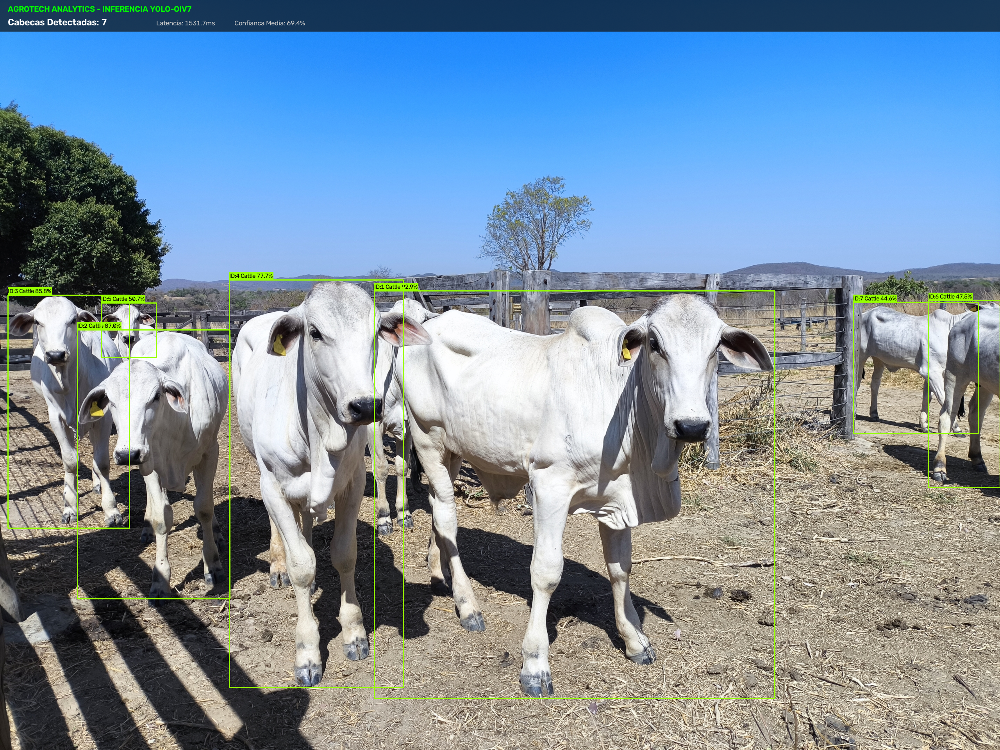

In [ ]:
import cv2
import json
import time
import urllib.request
import numpy as np
from pathlib import Path
from ultralytics import YOLO

# O Pulo do Gato para rodar OpenCV no Google Colab
from google.colab.patches import cv2_imshow

class MotorAgrotechYOLO:
    def __init__(self, limiar_confianca=0.35):
        print("[SYSTEM] Inicializando Motor de Visão Computacional AgroTech...")
        self.modelo = YOLO('yolov8m-oiv7.pt')
        self.limiar_confianca = limiar_confianca
        self.classes_alvo = self._mapear_classes_gado()

    def _mapear_classes_gado(self):
        """Busca no dicionário interno do modelo os IDs das classes relevantes."""
        alvos = ['Cow', 'Bull', 'Cattle', 'Livestock', 'Ox']
        ids_alvo = []
        for id_classe, nome_classe in self.modelo.names.items():
            if nome_classe in alvos:
                ids_alvo.append(id_classe)
        print(f"[SYSTEM] Classes de interesse mapeadas: {alvos} (IDs: {ids_alvo})")
        return ids_alvo

    def _desenhar_hud_profissional(self, img, contagem, tempo_ms, conf_media):
        """Desenha um painel transparente com estatísticas na imagem."""
        overlay = img.copy()
        altura_painel = 80
        cv2.rectangle(overlay, (0, 0), (img.shape[1], altura_painel), (15, 15, 15), -1)

        # Aplica a transparência no painel superior (Alpha blending)
        cv2.addWeighted(overlay, 0.7, img, 0.3, 0, img)

        fonte = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, "AGROTECH ANALYTICS - INFERENCIA YOLO-OIV7", (20, 30), fonte, 0.7, (0, 255, 0), 2)
        cv2.putText(img, f"Cabecas Detectadas: {contagem}", (20, 65), fonte, 0.8, (255, 255, 255), 2)
        cv2.putText(img, f"Latencia: {tempo_ms:.1f}ms", (400, 65), fonte, 0.6, (200, 200, 200), 1)
        cv2.putText(img, f"Confianca Media: {conf_media:.1f}%", (600, 65), fonte, 0.6, (200, 200, 200), 1)
        return img

    def processar_imagem(self, caminho_img):
        print(f"\n[ENGINE] Processando lote de imagem: {caminho_img}")

        img = cv2.imread(caminho_img)
        if img is None:
            print("[ERRO] Falha ao carregar a imagem.")
            return

        inicio_tempo = time.time()

        # Executa a predição filtrando estritamente pelas classes de gado
        resultados = self.modelo.predict(
            source=img,
            conf=self.limiar_confianca,
            classes=self.classes_alvo,
            verbose=False
        )

        tempo_inferencia = (time.time() - inicio_tempo) * 1000
        resultado = resultados[0]

        contagem = len(resultado.boxes)
        lista_confiancas = []
        payload_dados = []

        # Renderização gráfica comercial
        for i, box in enumerate(resultado.boxes):
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
            confianca = float(box.conf[0].cpu().numpy()) * 100
            lista_confiancas.append(confianca)

            nome_classe = self.modelo.names[int(box.cls[0].item())]

            payload_dados.append({
                "id_deteccao": i + 1,
                "classe": nome_classe,
                "confianca_pct": round(confianca, 2),
                "geometria_bbox": {"x_min": int(x1), "y_min": int(y1), "x_max": int(x2), "y_max": int(y2)}
            })

            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 150), 2)

            texto = f"ID:{i+1} {nome_classe} {confianca:.1f}%"
            (w_txt, h_txt), _ = cv2.getTextSize(texto, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
            cv2.rectangle(img, (x1, y1 - 20), (x1 + w_txt, y1), (0, 255, 150), -1)
            cv2.putText(img, texto, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

        conf_media = sum(lista_confiancas) / len(lista_confiancas) if contagem > 0 else 0
        img_final = self._desenhar_hud_profissional(img, contagem, tempo_inferencia, conf_media)

        cv2.imwrite("laudo_agrotech.jpg", img_final)

        json_saida = {
            "metadata_lote": {
                "timestamp_processamento": time.strftime("%Y-%m-%dT%H:%M:%SZ", time.gmtime()),
                "total_cabecas_detectadas": contagem,
                "confianca_media_lote": round(conf_media, 2),
                "tempo_inferencia_ms": round(tempo_inferencia, 2)
            },
            "detalhamento_animais": payload_dados
        }

        with open("dados_contagem.json", "w") as f:
            json.dump(json_saida, f, indent=4)

        print(f"[SUCESSO] Detecção concluída: {contagem} animais encontrados.")
        print("[SUCESSO] Dados estruturados salvos em: dados_contagem.json")
        print("\n[EXIBIÇÃO] Gerando dashboard visual abaixo:")

        # Usa o renderizador próprio do Colab
        cv2_imshow(img_final)


def executar_simulacao():
    print("="*75)
    print("SISTEMA DE CONTAGEM DE GADO - PADRÃO COMERCIAL")
    print("="*75)

    img_path = "rebanho_teste.jpg"
    if not Path(img_path).exists():
        print("-> Baixando imagem aérea de rebanho para teste...")
        url_imagem = "https://go.agenciasebrae.com.br/wp-content/uploads/sites/9/2024/10/Sodino-Fazenda-Nova-Carla-Gomes-1-scaled.jpg"
        req = urllib.request.Request(url_imagem)
        with urllib.request.urlopen(req) as resposta, open(img_path, 'wb') as arquivo_saida:
            arquivo_saida.write(resposta.read())

    motor = MotorAgrotechYOLO(limiar_confianca=0.20)
    motor.processar_imagem(img_path)

if __name__ == "__main__":
    executar_simulacao()